# Лабораторная работа №4. Визуализация данных
## Задание 1: Использование основных типов графиков.
Используйте набор данных о продажах автомобилей и создайте различные типы графиков, чтобы отобразить различные аспекты данных. 
Включите 
- столбчатые диаграммы, 
- гистограммы, 
- линейные графики, 
- диаграммы размаха
- ящик с усами
- радиальные диаграммы
- scatter plot.

In [1]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster

# Загрузка данных
car_sales_1 = pd.read_csv('data_41/car_data.csv')
car_sales_2 = pd.read_csv('data_41/car_details_from_car_dekho.csv')
car_sales_3 = pd.read_csv('data_41/car_details_v3.csv')
car_sales_4 = pd.read_csv('data_41/car_details_v4.csv')

# Просмотр данных
print(car_sales_1.head())

  Car_Name  Year  Selling_Price  Present_Price  Kms_Driven Fuel_Type  \
0     ritz  2014           3.35           5.59       27000    Petrol   
1      sx4  2013           4.75           9.54       43000    Diesel   
2     ciaz  2017           7.25           9.85        6900    Petrol   
3  wagon r  2011           2.85           4.15        5200    Petrol   
4    swift  2014           4.60           6.87       42450    Diesel   

  Seller_Type Transmission  Owner  
0      Dealer       Manual      0  
1      Dealer       Manual      0  
2      Dealer       Manual      0  
3      Dealer       Manual      0  
4      Dealer       Manual      0  


In [2]:
print(car_sales_2.head())

                       name  year  selling_price  km_driven    fuel  \
0             Maruti 800 AC  2007          60000      70000  Petrol   
1  Maruti Wagon R LXI Minor  2007         135000      50000  Petrol   
2      Hyundai Verna 1.6 SX  2012         600000     100000  Diesel   
3    Datsun RediGO T Option  2017         250000      46000  Petrol   
4     Honda Amaze VX i-DTEC  2014         450000     141000  Diesel   

  seller_type transmission         owner  
0  Individual       Manual   First Owner  
1  Individual       Manual   First Owner  
2  Individual       Manual   First Owner  
3  Individual       Manual   First Owner  
4  Individual       Manual  Second Owner  


In [3]:
print(car_sales_3.head())

                           name  year  selling_price  km_driven    fuel  \
0        Maruti Swift Dzire VDI  2014         450000     145500  Diesel   
1  Skoda Rapid 1.5 TDI Ambition  2014         370000     120000  Diesel   
2      Honda City 2017-2020 EXi  2006         158000     140000  Petrol   
3     Hyundai i20 Sportz Diesel  2010         225000     127000  Diesel   
4        Maruti Swift VXI BSIII  2007         130000     120000  Petrol   

  seller_type transmission         owner     mileage   engine   max_power  \
0  Individual       Manual   First Owner   23.4 kmpl  1248 CC      74 bhp   
1  Individual       Manual  Second Owner  21.14 kmpl  1498 CC  103.52 bhp   
2  Individual       Manual   Third Owner   17.7 kmpl  1497 CC      78 bhp   
3  Individual       Manual   First Owner   23.0 kmpl  1396 CC      90 bhp   
4  Individual       Manual   First Owner   16.1 kmpl  1298 CC    88.2 bhp   

                     torque  seats  
0            190Nm@ 2000rpm    5.0  
1       250N

In [4]:
print(car_sales_4.head())

            Make                            Model    Price  Year  Kilometer  \
0          Honda              Amaze 1.2 VX i-VTEC   505000  2017      87150   
1  Maruti Suzuki                  Swift DZire VDI   450000  2014      75000   
2        Hyundai             i10 Magna 1.2 Kappa2   220000  2011      67000   
3         Toyota                         Glanza G   799000  2019      37500   
4         Toyota  Innova 2.4 VX 7 STR [2016-2020]  1950000  2018      69000   

  Fuel Type Transmission   Location   Color   Owner Seller Type   Engine  \
0    Petrol       Manual       Pune    Grey   First   Corporate  1198 cc   
1    Diesel       Manual   Ludhiana   White  Second  Individual  1248 cc   
2    Petrol       Manual    Lucknow  Maroon   First  Individual  1197 cc   
3    Petrol       Manual  Mangalore     Red   First  Individual  1197 cc   
4    Diesel       Manual     Mumbai    Grey   First  Individual  2393 cc   

            Max Power              Max Torque Drivetrain  Length   W

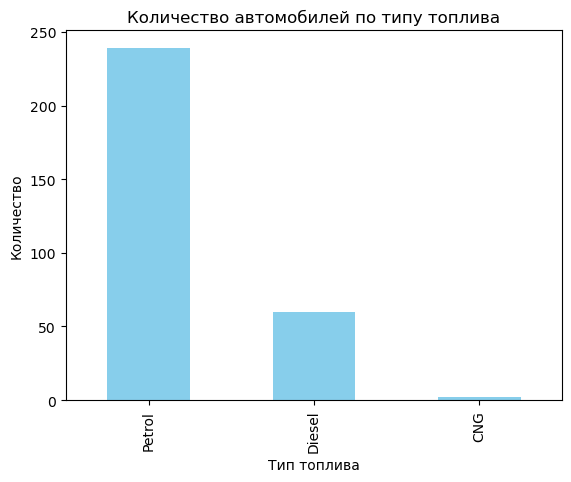

In [5]:
import matplotlib.pyplot as plt

# Пример столбчатого графика
car_sales_1['Fuel_Type'].value_counts().plot(kind='bar', color='skyblue')
plt.title('Количество автомобилей по типу топлива')
plt.xlabel('Тип топлива')
plt.ylabel('Количество')
plt.show()

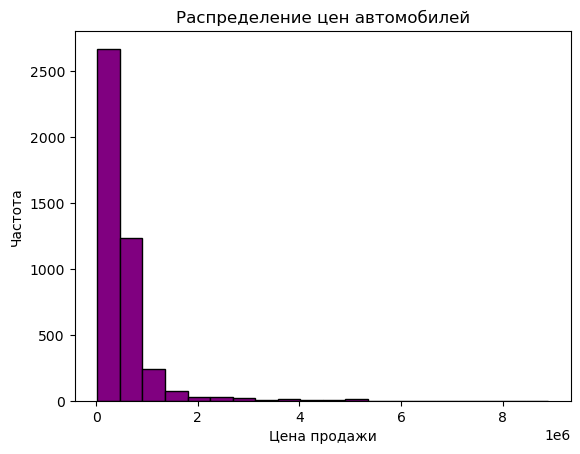

In [6]:
# Гистограмма цены автомобилей
plt.hist(car_sales_2['selling_price'], bins=20, color='purple', edgecolor='black')
plt.title('Распределение цен автомобилей')
plt.xlabel('Цена продажи')
plt.ylabel('Частота')
plt.show()

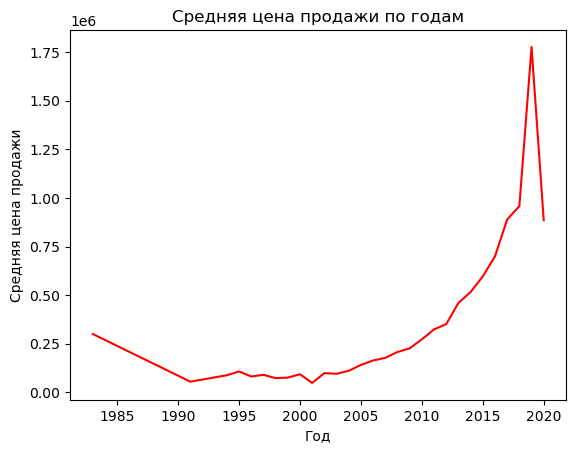

In [7]:
# Линейный график изменения продаж по году
car_sales_3.groupby('year')['selling_price'].mean().plot(kind='line', color='red')
plt.title('Средняя цена продажи по годам')
plt.xlabel('Год')
plt.ylabel('Средняя цена продажи')
plt.show()

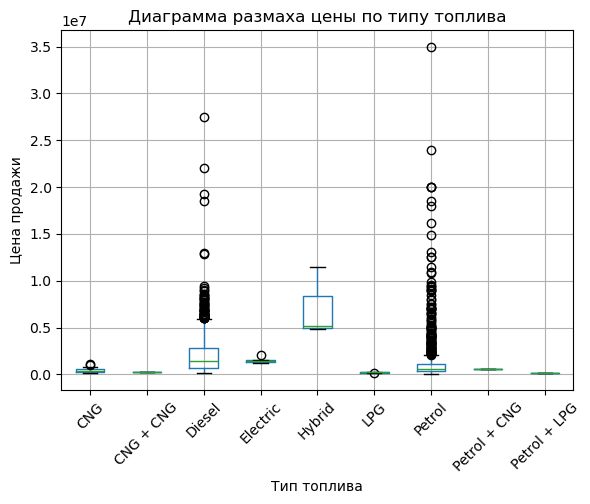

In [8]:
# Boxplot для цены продажи
car_sales_4.boxplot(column='Price', by='Fuel Type')
plt.title('Диаграмма размаха цены по типу топлива')
plt.suptitle('')
plt.xlabel('Тип топлива')
plt.ylabel('Цена продажи')

# Наклон меток на оси X
plt.xticks(rotation=45)

# Отображение графика
plt.show()

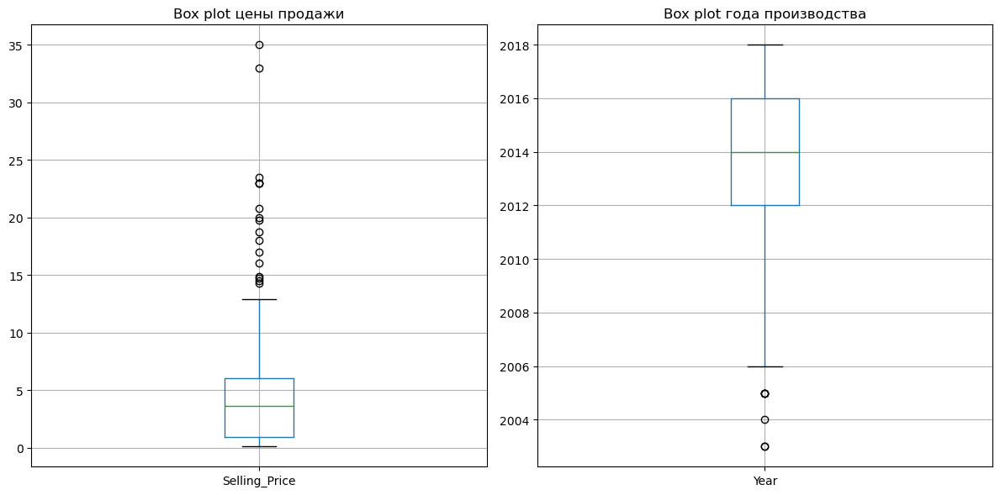

In [9]:
import matplotlib.pyplot as plt

# Создание фигуры с двумя подграфиками (1 строка, 2 столбца)
plt.figure(figsize=(12, 6))  # Установите размер фигуры по вашему усмотрению

# Первый подграфик для Selling_Price
plt.subplot(1, 2, 1)  # 1 строка, 2 столбца, 1-й график
car_sales_1[['Selling_Price']].boxplot()
plt.title('Box plot цены продажи')

# Второй подграфик для Year
plt.subplot(1, 2, 2)  # 1 строка, 2 столбца, 2-й график
car_sales_1[['Year']].boxplot()
plt.title('Box plot года производства')

# Показать графики
plt.tight_layout()  # Автоматическая настройка отступов
plt.show()

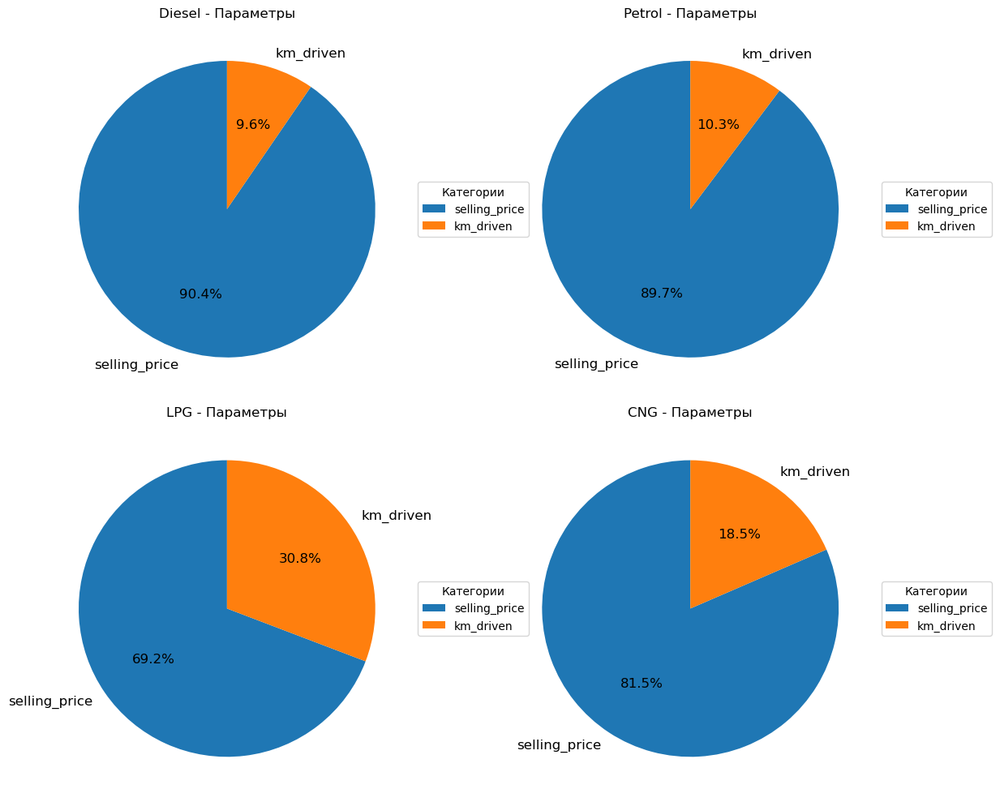

In [10]:
import numpy as np
import matplotlib.pyplot as plt

# Подготовка данных
fuel_types = car_sales_3['fuel'].unique()
categories = ['selling_price', 'km_driven']  # Параметры для сравнения

# Средние значения параметров для каждого типа топлива
values = []
for fuel in fuel_types:
    avg_values = car_sales_3[car_sales_3['fuel'] == fuel][categories].mean().values
    values.append(avg_values)

# Функция для построения диаграммы в форме пирога
def pie_chart(data, categories, fuel_types):
    num_fuels = len(fuel_types)
    
    # Подготовка 2x2 сетки
    rows, cols = 2, 2
    fig, axes = plt.subplots(rows, cols, figsize=(12, 10))
    
    # Если всего 1 или 2 диаграммы, нужно уменьшить количество поддиаграмм
    axes = axes.flatten()  # Преобразуем массив в одномерный, чтобы удобно обращаться к каждому элементу

    for i, fuel in enumerate(fuel_types):
        values = data[i]
        wedges, texts, autotexts = axes[i].pie(values, labels=categories, autopct='%1.1f%%', startangle=90)
        axes[i].set_title(f'{fuel} - Параметры')
        
        # Настройка внешнего вида
        for t in texts:
            t.set_fontsize(12)
        for at in autotexts:
            at.set_fontsize(12)
        
        # Добавление легенды
        axes[i].legend(wedges, categories, title="Категории", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

    # Убираем лишние пустые субплоты (если есть)
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# Вызов функции для построения диаграмм в форме пирога
pie_chart(values, categories, fuel_types)

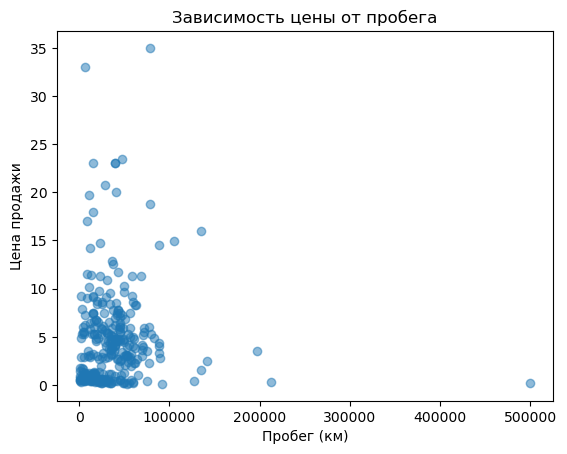

In [11]:
# Scatter plot зависимости цены от километража
plt.scatter(car_sales_1['Kms_Driven'], car_sales_1['Selling_Price'], alpha=0.5)
plt.title('Зависимость цены от пробега')
plt.xlabel('Пробег (км)')
plt.ylabel('Цена продажи')
plt.show()

## Задание 2: Создание тепловой карты корреляции.
Используйте набор данных о погоде и с помощью библиотеки seaborn создайте тепловую карту, чтобы отобразить корреляцию между различными параметрами погоды.

In [12]:
city_attributes = pd.read_csv('data_42/city_attributes.csv')
humidity = pd.read_csv('data_42/humidity.csv')
pressure = pd.read_csv('data_42/pressure.csv')
temperature = pd.read_csv('data_42/temperature.csv')
weather_description = pd.read_csv('data_42/weather_description.csv')
wind_direction = pd.read_csv('data_42/wind_direction.csv')
wind_speed = pd.read_csv('data_42/wind_speed.csv')

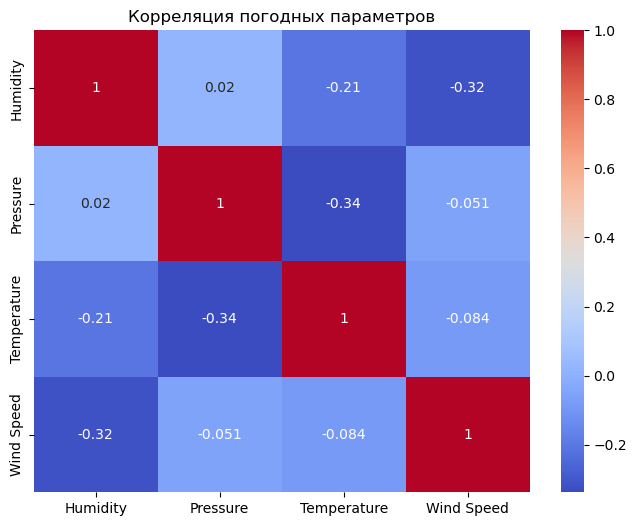

In [13]:
# Пример: объединение данных по времени (индексы дат)
# Выбираем несколько городов для визуализации
cities = ['New York', 'Los Angeles', 'Chicago']

# Транспонируем и выбираем данные только для указанных городов
humidity = humidity[cities].T
pressure = pressure[cities].T
temperature = temperature[cities].T
wind_speed = wind_speed[cities].T

# Создание общего DataFrame
combined_data = pd.DataFrame({
    'Humidity': humidity.mean(),
    'Pressure': pressure.mean(),
    'Temperature': temperature.mean(),
    'Wind Speed': wind_speed.mean()
})

# Построение тепловой карты
import seaborn as sns
import matplotlib.pyplot as plt

# Расчет корреляционной матрицы
corr_matrix = combined_data.corr()

# Построение тепловой карты
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Корреляция погодных параметров')
plt.show()

## Задание 3: Использование plotly для создания интерактивных графиков.
Скачайте набор данных о выборах и используйте Plotly для создания интерактивных графиков, таких как интерактивные карты или диаграммы с подсказками.

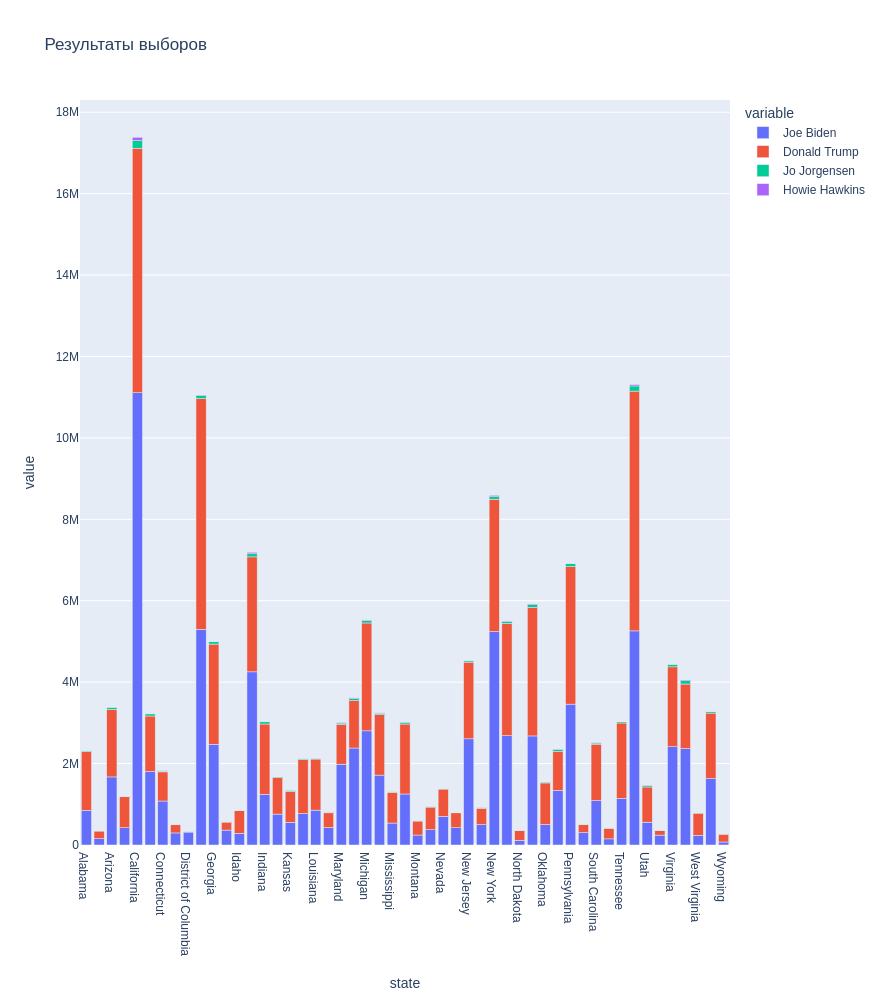

In [14]:
import pandas as pd
import plotly.express as px

# Загрузка данных
elections_data = pd.read_csv('data_43/president_county_candidate.csv')

# Фильтрация данных для нужных кандидатов
candidates_of_interest = ['Joe Biden', 'Donald Trump', 'Jo Jorgensen', 'Howie Hawkins']
filtered_data = elections_data[elections_data['candidate'].isin(candidates_of_interest)]

# Агрегируем данные, если необходимо, чтобы каждый кандидат имел значение для каждого штата
aggregated_data = filtered_data.groupby(['state', 'candidate'], as_index=False)['total_votes'].sum()

# Пивотируем таблицу, чтобы столбцы были непрерывными
pivoted_data = aggregated_data.pivot(index='state', columns='candidate', values='total_votes').reset_index()

# Заполнение пропусков нулями
pivoted_data = pivoted_data.fillna(0)

# Создание графика
fig = px.bar(pivoted_data, x='state', y=candidates_of_interest, title="Результаты выборов", width=1000, height=1000)
fig.show()

## Задание 4: Создание визуализаций временных рядов.
Возьмите набор данных о COVID-19 от Джона Хопкинса и создайте визуализации временных рядов для показа изменения числа случаев заражения и смертей по времени.

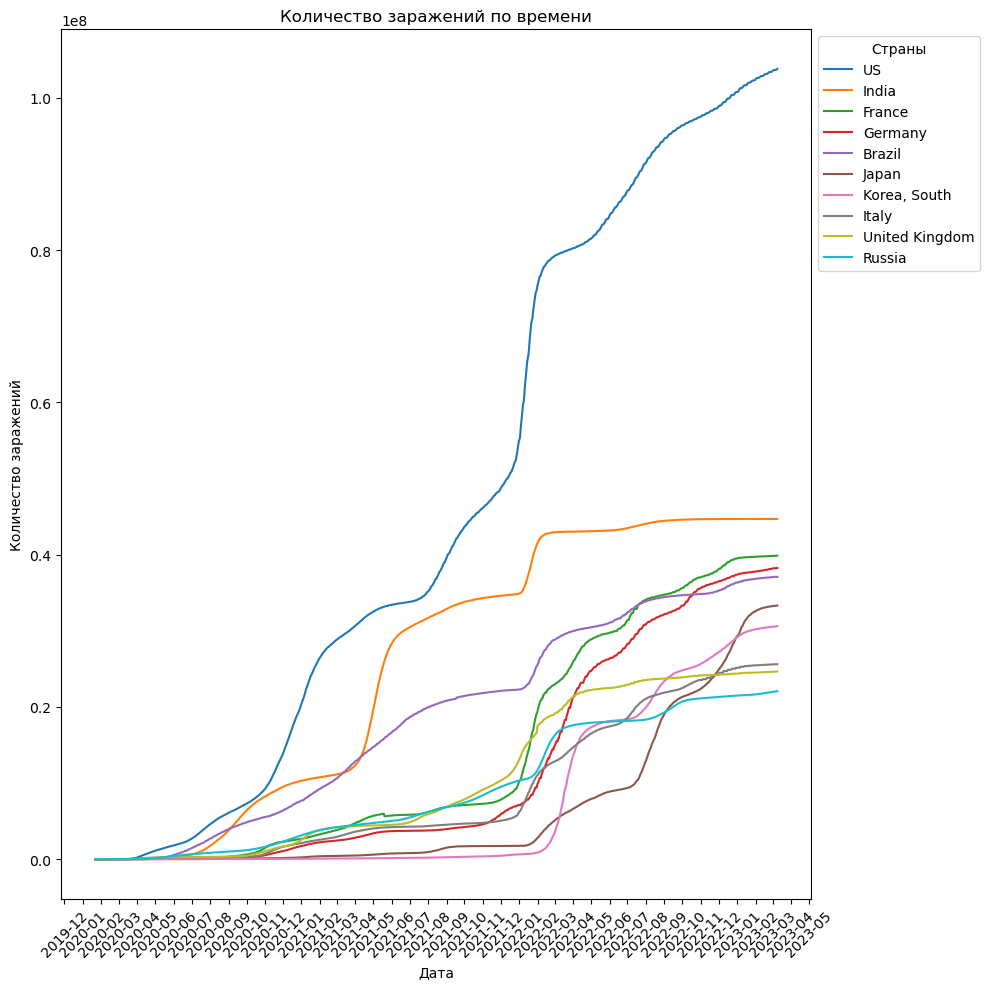

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Функция для замены текстовых значений на 0
def replace_text_with_zero(value):
    if isinstance(value, str):  # Проверяем, является ли значение строкой
        return 0
    return value

# Загрузка данных
covid_data = pd.read_csv('data_44/time_series_covid19_confirmed_global.csv')

# Удаление лишних колонок (если они есть)
covid_data = covid_data.drop(['Province/State', 'Lat', 'Long'], axis=1, errors='ignore')

# Группировка данных по странам
covid_data = covid_data.groupby('Country/Region').sum().T

# Преобразование индекса в формат datetime с указанием формата
covid_data.index = pd.to_datetime(covid_data.index, format='%m/%d/%y')

# Применение функции для замены текстовых значений на 0
covid_data = covid_data.map(replace_text_with_zero)

# Список стран для отображения (например, 10 самых затронутых)
top_countries = covid_data.max().sort_values(ascending=False).head(10).index

# Построение графика для 10 стран
fig, ax = plt.subplots(figsize=(10, 10))

for country in top_countries:
    ax.plot(covid_data.index, covid_data[country], label=country)

# Настройка заголовков и меток осей
plt.title('Количество заражений по времени')
plt.xlabel('Дата')
plt.ylabel('Количество заражений')

# Установка интервала меток по месяцам на оси X
ax.xaxis.set_major_locator(mdates.MonthLocator())  # Отображение по месяцам
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Формат месяца и года

# Поворот меток даты для удобства чтения
plt.xticks(rotation=45)

# Перемещение легенды за пределы графика
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), title="Страны")

# Автоматическая подгонка элементов
plt.tight_layout()

# Отображение графика
plt.show()

## Задание 5: Использование географической визуализации.
С использованием набора данных о террористических атаках создайте географическую визуализацию для показа, где происходят террористические атаки по миру, используя библиотеку Folium или Geopandas.

In [16]:
import pandas as pd
import folium

attacks_data = pd.read_csv('data_45/terrorism.csv', encoding='ISO-8859-1', low_memory=False)
attacks_data = attacks_data[['latitude', 'longitude', 'country_txt', 'city']].dropna()

In [17]:
# Пример: выбираем только первые 10000 записей
sample_data = attacks_data.sample(n=10000, random_state=1)

# Создаем карту
map_ = folium.Map(location=[sample_data['latitude'].mean(), sample_data['longitude'].mean()], zoom_start=2)

# Создаем кластер маркеров
marker_cluster = MarkerCluster().add_to(map_)

# Добавляем маркеры в кластер
for idx, row in sample_data.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"Страна: {row['country_txt']}\nГород: {row['city']}",
    ).add_to(marker_cluster)

# Сохраняем карту в файл
map_.save('terrorist_attacks_map.html')

# Отобразим карту
map_